# Picture compression

In this tutorial we will see how a picture can be compressed as a tensor train.

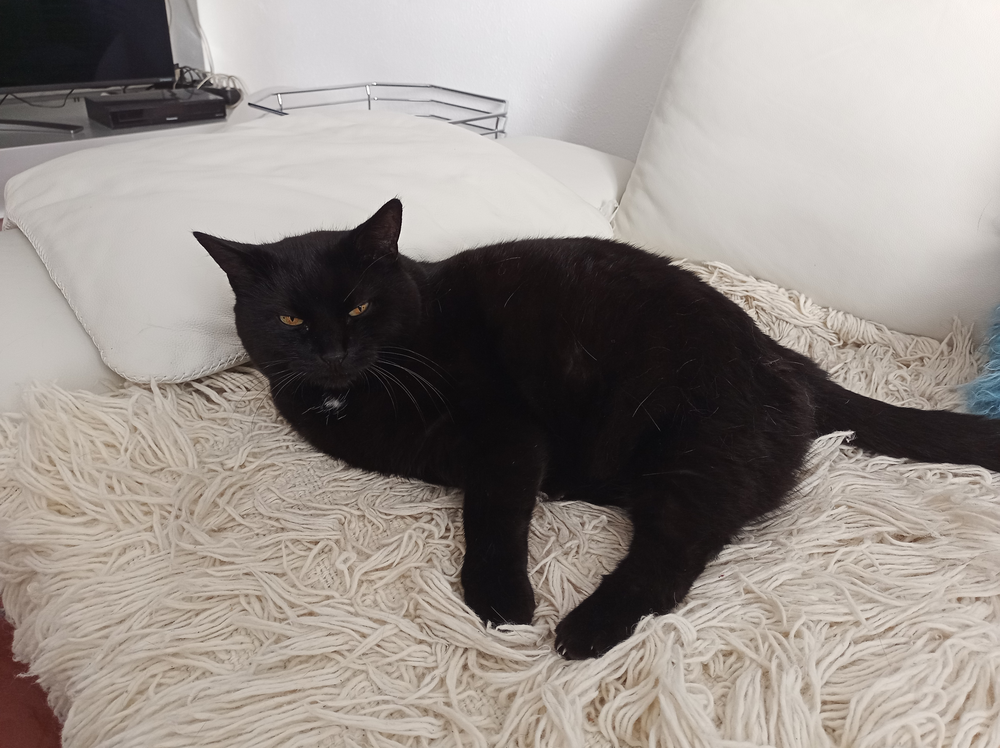

In [1]:
from math import prod
import numpy as np
from trainsum.numpy import trainsum as ts

from imageio.v3 import imread, imwrite
from IPython.display import Image
import matplotlib.pyplot as plt

def compression_rate(shape: ts.TrainShape):
    """Calculate the compression rate defined by a TrainShape."""
    full_numel = prod(dim.size() for dim in shape.dims)
    approx_numel = 0
    for i in range(len(shape)):
        approx_numel += prod(shape.middle(i)) * shape.left_rank(i) * shape.right_rank(i)
    return 100*approx_numel/full_numel

# load the picture
cat_data = imread("findus_catus.jpg")
cat_data = np.asarray(cat_data, dtype=np.float64)
shape = ts.trainshape(*cat_data.shape, mode="block")

# display the chonker
Image(filename="findus_catus.jpg") 

As a first step we load the data with the package imageio. We also create the tensor train shape which is three-dimensional.

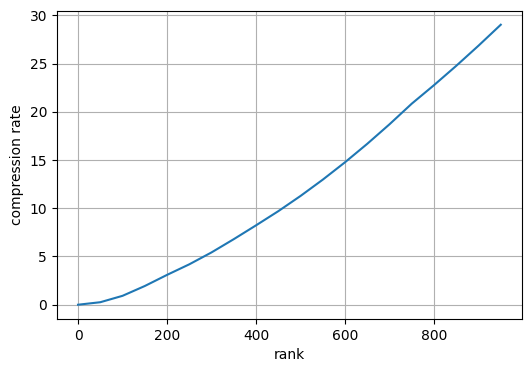

In [2]:
# example compression rates for different ranks
ranks = np.arange(0, 1000, 50)
rates = []
for rank in ranks:
    shape.ranks = int(rank)
    rates.append(compression_rate(shape))

plt.figure(figsize=(6, 4))
plt.plot(ranks, rates)
plt.xlabel("rank")
plt.ylabel("compression rate")
plt.grid()
plt.show()

To get a feeling for the compression rate that can be achieved we plot the rank of the network against the rate.

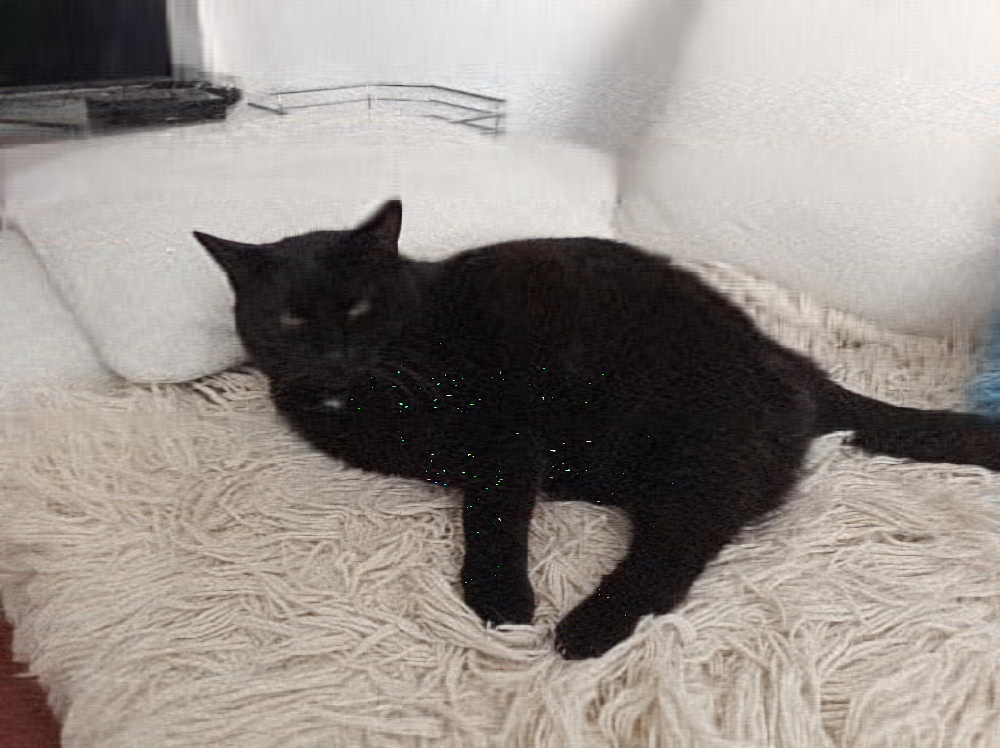

In [3]:
# approximate the picture with singular value decompositions
with ts.decomposition(max_rank=100, cutoff=1e-10, ncores=2):
    cat_train = ts.tensortrain(shape, cat_data)

# reconstruct the picture and show the picture
cat_pic = np.asarray(np.round(cat_train.to_tensor()), dtype=np.uint8)
imwrite("findus_catus_approx.jpg", cat_pic)
Image(filename="findus_catus_approx.jpg")

Here we approximate the picture with a decomposition approach.

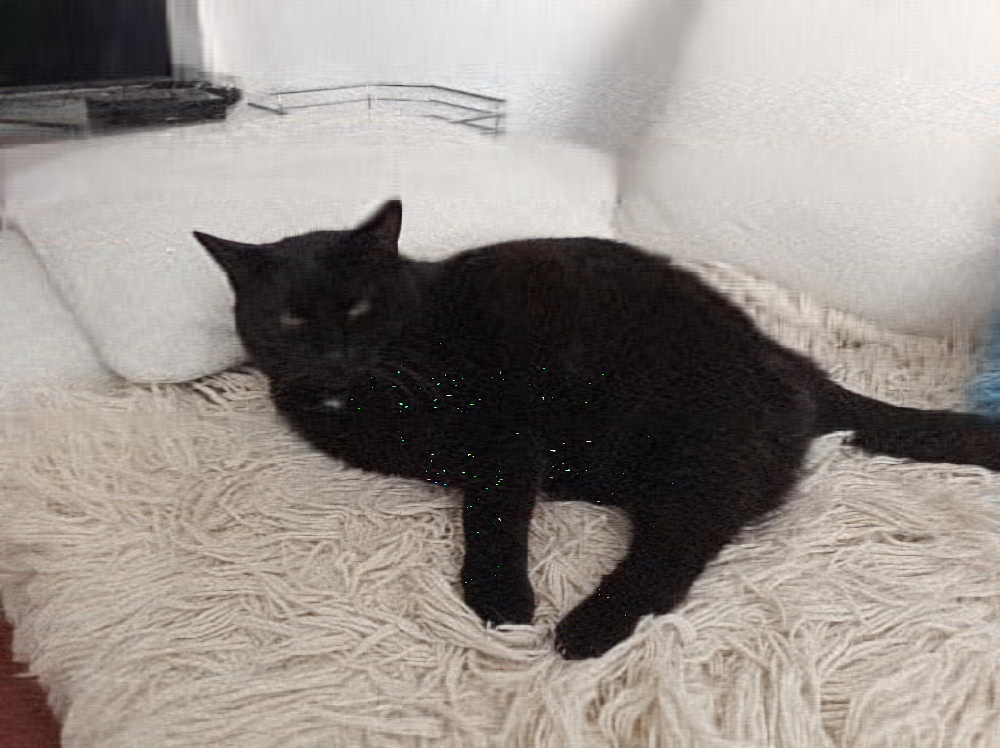

In [4]:
# approximate the picture variationally
with ts.variational(max_rank=100, cutoff=1e-10, ncores=2, nsweeps=2):
    cat_train = ts.tensortrain(shape, cat_data)
    
# reconstruct the picture and show it
cat_pic = np.asarray(np.round(cat_train.to_tensor()), dtype=np.uint8)
imwrite("findus_catus_approx.jpg", cat_pic)
Image(filename="findus_catus_approx.jpg")

After that we approximate the picture variationally.

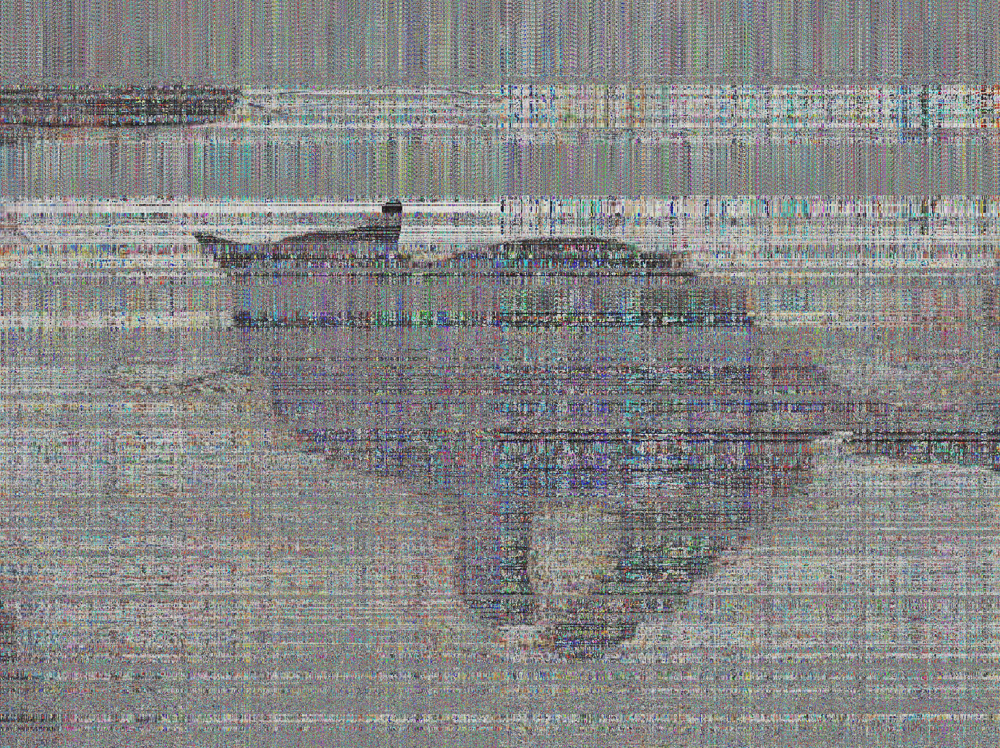

In [5]:
# approximate the picture by sampling
func = lambda idxs: cat_data[idxs[0], idxs[1], idxs[2]]
with ts.cross(max_rank=100, eps=1e-10):
    cat_train = ts.tensortrain(shape, func)
    
# reconstruct the picture and show it
cat_pic = np.asarray(np.round(cat_train.to_tensor()), dtype=np.uint8)
imwrite("findus_catus_approx.jpg", cat_pic)
Image(filename="findus_catus_approx.jpg")

In the end it is approximated by the cross interpolation.